# Text Generator

## Import Libraries and initialize GPU

In [ ]:
import numpy as np
import sys
import tensorflow as tf
from nltk.corpus import stopwords
from keras.models import Sequential, load_model
from keras.layers import LSTM, Dense, Embedding, Dropout
from keras.losses import sparse_categorical_crossentropy
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint
import string
import os
import json


device_name = tf.test.gpu_device_name()
print('Found GPU at: {}'.format(device_name))

print(tf.__version__)

Found GPU at: /device:GPU:0
2.8.0


## Preparing data

In [ ]:
!git clone https://github.com/abrekkamil/Computational-Creativity-Project.git

Cloning into 'Computational-Creativity-Project'...
remote: Enumerating objects: 14, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 14 (delta 5), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (14/14), done.


In [ ]:
dataset_selection = 'Full' #@param ["Full", "London", "Manchester"] {allow-input: true}
dataset = 'Computational-Creativity-Project/property_description_' + dataset_selection + '.json'

with open(dataset) as file:
    data = json.load(file, encoding='cp1252')

text = ''
for i in data:
    text = text + i['Property description']

print(len(text))

2828155


In [ ]:
def clean_text(txt):
    txt = txt.lower().replace(':', '')
    txt = txt.encode("utf8").decode("ascii",'ignore')
    return txt 

text = [clean_text(x) for x in text]

In [ ]:
vocab = sorted(set(text))
char_to_ind = {char:i for i, char in enumerate(vocab)}
ind_to_char = np.array(vocab)

encoded_text = np.array([char_to_ind[c] for c in text])

In [ ]:
char_dataset = tf.data.Dataset.from_tensor_slices(encoded_text)

In [ ]:
#@title Set up Sequence Lenght
seq_len = 100  # @param {type: "integer"}
sequences = char_dataset.batch(seq_len+1, drop_remainder=True)

def create_seq_targets(seq):
    input_txt = seq[:-1]
    target_txt = seq[1:]
    return input_txt, target_txt
    
dataset = sequences.map(create_seq_targets)

for input_txt, target_txt in  dataset.take(1):
    print(input_txt.numpy())
    print(''.join(ind_to_char[input_txt.numpy()]))
    print('\n')
    print(target_txt.numpy())
    # There is an extra whitespace!
    print(''.join(ind_to_char[target_txt.numpy()]))

[44 47 35 33 52 37 36  2 41 46  2 33  2 49 53 41 37 52  2 52 53 50 46 41
 46 39  2 41 51  2 52 40 41 51  2 44 33 50 39 37  2 37 56 52 37 46 36 37
 36  2 52 40 50 37 37  2 34 37 36 50 47 47 45  2 17 25 19 16  7 51  2 40
 47 45 37  2 55 41 52 40  2 51 48 33 35 37  2 33 46 36  2 46 33 52 53 50
 33 44  2 44]
located in a quiet turning is this large extended three bedroom 1930's home with space and natural l


[47 35 33 52 37 36  2 41 46  2 33  2 49 53 41 37 52  2 52 53 50 46 41 46
 39  2 41 51  2 52 40 41 51  2 44 33 50 39 37  2 37 56 52 37 46 36 37 36
  2 52 40 50 37 37  2 34 37 36 50 47 47 45  2 17 25 19 16  7 51  2 40 47
 45 37  2 55 41 52 40  2 51 48 33 35 37  2 33 46 36  2 46 33 52 53 50 33
 44  2 44 41]
ocated in a quiet turning is this large extended three bedroom 1930's home with space and natural li


In [ ]:
#@title Set up Dataset Parameters
# Batch size
batch_size = 128 # @param {type: "integer"}

# Buffer size to shuffle the dataset so it doesn't attempt to shuffle
# the entire sequence in memory. Instead, it maintains a buffer in which it shuffles elements
buffer_size = 10000 # @param {type: "integer"}

dataset = dataset.shuffle(buffer_size).batch(batch_size, drop_remainder=True)

## Text Generator Model

In [ ]:
#@title Set up Optimizer Parameters
# default: 0.001
opt_learning_rate = 0.001  # @param {type: "raw"}
# default: 0.5
opt_beta = 0.5 # @param {type: "raw"}
optimizer = tf.keras.optimizers.Adam(opt_learning_rate, beta_1=opt_beta)

def sparse_cat_loss(y_true,y_pred):
  return sparse_categorical_crossentropy(y_true, y_pred, from_logits=True)

def create_model(vocab_size, embed_dim, rnn_neurons, batch_size):
    model = Sequential()
    model.add(Embedding(vocab_size, embed_dim,batch_input_shape=[batch_size, None]))
    model.add(LSTM(rnn_neurons*2,return_sequences=True,stateful=True))
    model.add(Dropout(0.2))
    model.add(LSTM(rnn_neurons,return_sequences=True,stateful=True, activation='sigmoid'))
    model.add(Dense(vocab_size*2))
    # Final Dense Layer to Predict
    model.add(Dense(vocab_size))
    model.compile(optimizer=optimizer, loss=sparse_cat_loss) 
    return model

In [ ]:
#@title Set up Model Parameters
# Length of the vocabulary in chars
vocab_size = len(vocab)
# The embedding dimension
embed_dim = 256 # @param {type: "integer"}
# Number of RNN units
rnn_neurons = 1024 # @param {type: "integer"}

In [ ]:
#Create the model
model = create_model(
  vocab_size = vocab_size,
  embed_dim=embed_dim,
  rnn_neurons=rnn_neurons,
  batch_size=batch_size)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (128, None, 256)          15360     
                                                                 
 lstm (LSTM)                 (128, None, 2048)         18882560  
                                                                 
 dropout (Dropout)           (128, None, 2048)         0         
                                                                 
 lstm_1 (LSTM)               (128, None, 1024)         12587008  
                                                                 
 dense (Dense)               (128, None, 120)          123000    
                                                                 
 dense_1 (Dense)             (128, None, 60)           7260      
                                                                 
Total params: 31,615,188
Trainable params: 31,615,188
No

## Connecting to the Drive for checkpoints

In [ ]:
#@title Save checkpoints during training
#@markdown If you select don't save checkpoints to the Google Drive, model weights will be saved to a local file named "property_gen.h5" after training
save_checkpoints = False #@param {type:"boolean"}

if save_checkpoints:
  from google.colab import drive
  drive.mount('/content/gdrive')

  # Directory where the checkpoints will be saved
  path = 'My Drive/Project/Colab/double_LSTM/' #@param{type: 'string'}
  full_path = "/content/gdrive/" + path + "ckpt_{epoch}"  

  checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
                        filepath=full_path,
                        save_weights_only=True)

## Training the Text Generation

In [ ]:
#@title Training the model
train_model = False #@param {type:"boolean"}
if train_model:
  epochs = 10 # @param {type:'integer'}
  if save_checkpoints:
    history = model.fit(dataset,epochs=epochs, callbacks=[checkpoint_callback])
  else:
    history = model.fit(dataset,epochs=epochs)

Epoch 1/10
218/218 [==============================] - 190s 840ms/step - loss: 2.1688
Epoch 2/10
218/218 [==============================] - 190s 862ms/step - loss: 1.1124
Epoch 3/10
218/218 [==============================] - 189s 862ms/step - loss: 0.8879
Epoch 4/10
218/218 [==============================] - 189s 862ms/step - loss: 0.7904
Epoch 5/10
218/218 [==============================] - 190s 863ms/step - loss: 0.7271
Epoch 6/10
218/218 [==============================] - 189s 859ms/step - loss: 0.6789
Epoch 7/10
218/218 [==============================] - 190s 863ms/step - loss: 0.6397
Epoch 8/10
218/218 [==============================] - 189s 862ms/step - loss: 0.6058
Epoch 9/10
218/218 [==============================] - 189s 859ms/step - loss: 0.5757
Epoch 10/10
218/218 [==============================] - 189s 862ms/step - loss: 0.5495


## Creatining model for generating text

In [ ]:
batch_size = 1
if save_checkpoints and train_model:
  model = create_model(vocab_size, embed_dim, rnn_neurons,batch_size=batch_size)
  model.load_weights(tf.train.latest_checkpoint("/content/gdrive/" + path))
  model.build(tf.TensorShape([batch_size, None]))
else:
  if train_model:
    model.save('property_gen.h5') 
  model = create_model(vocab_size, embed_dim, rnn_neurons, batch_size=1)
  model.load_weights('property_gen.h5')
  model.build(tf.TensorShape([1, None]))

## Text generator function

In [ ]:
def generate_text(model, start_seed,gen_size=100,temp=1.0):
  '''
  model: Trained Model to Generate Text
  start_seed: Intial Seed text in string form
  gen_size: Number of characters to generate
  Basic idea behind this function is to take in some seed text, format it so
  that it is in the correct shape for our network, then loop the sequence as
  we keep adding our own predicted characters.
  '''
  # Number of characters to generate
  num_generate = gen_size
  # Vecotrizing starting seed text
  input_eval = [char_to_ind[s] for s in start_seed]
  # Expand to match batch format shape
  input_eval = tf.expand_dims(input_eval, 0)
  # Empty list to hold resulting generated text
  text_generated = []
  # Temperature effects randomness in our resulting text
  # The term is derived from entropy/thermodynamics.
  # The temperature is used to effect probability of next characters.
  # Higher probability == lesss surprising/ more expected
  # Lower temperature == more surprising / less expected
  temperature = temp
  # Here batch size == 1
  model.reset_states()
  for i in range(num_generate):
      # Generate Predictions
      predictions = model(input_eval)
      # Remove the batch shape dimension
      predictions = tf.squeeze(predictions, 0)
      # Use a cateogircal disitribution to select the next character
      predictions = predictions / temperature
      predicted_id = tf.random.categorical(predictions, num_samples=1)[-1,0].numpy()
      # Pass the predicted charracter for the next input
      input_eval = tf.expand_dims([predicted_id], 0)
      # Transform back to character letter
      text_generated.append(ind_to_char[predicted_id])
  return (start_seed + ''.join(text_generated))

## Generated Texts

In [ ]:
#@title Generated text example
input_text = "house" #@param{type: 'string'}
genereted_size = 500 #@param{type: 'integer'}
print(generate_text(model,"house",gen_size=genereted_size))

house are set out as a general outline only for the guidance of intending purchasers, and do not constitute any part of an offer or contract. intending purchasers should not rely on them as statements of representation or fact, but must satisfy themselves by inspection or otherwise as to their accuracy. no person in the employment of jp & brimelow ltd has any authority to make or give any representation or warranty whathortantance   extended to approximate an at over 20 feet. it also comes with famil


In [ ]:
#@title Generate Texts for Image Generation
#@markdown Write input texts for generation
genereted_size = 100
input_text1 = "house" #@param{type: 'string'}
input_text2 = "bedrooms" #@param{type: 'string'}
input_text3 = "kitchen" #@param{type: 'string'}
input_text4 = "living room" #@param{type: 'string'}
input_text5 = "floor" #@param{type: 'string'}
input_text6 = "garden" #@param{type: 'string'}
text1 = generate_text(model,input_text1,gen_size=genereted_size) 
text2 = generate_text(model,input_text2,gen_size=genereted_size)
text3 = generate_text(model,input_text3,gen_size=genereted_size)
text4 = generate_text(model,input_text4,gen_size=genereted_size)
text5 = generate_text(model,input_text5,gen_size=genereted_size)
text6 = generate_text(model,input_text6,gen_size=genereted_size)

In [ ]:
print(text1)
print(text2)
print(text3)
print(text4)
print(text5)
print(text6)

house with attractive communal gardens and off street parking for several cars. the ground floor ideal fo
bedrooms having a full of airing accommodation comprising of a w.c, spacious living space,;kitchen/diner 18
kitchen/dining room - 15'6" x 8'11" - shower /5407 sq ft of accompodation esters than i/minious terrace pro
living room with space for a range oven, wash hand basin and a door providing access to the side pave! to the f
floor rooms. the first floor oaccomplete or book your viewing now to avoid and disappointment.epc band 
garden areas. a master bedroom is still available it is a three level with scope for growing families, wel


# Image Generator

In [ ]:
# @title Licensed under the MIT License

# Copyright (c) 2021 Katherine Crowson

# Permission is hereby granted, free of charge, to any person obtaining a copy
# of this software and associated documentation files (the "Software"), to deal
# in the Software without restriction, including without limitation the rights
# to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
# copies of the Software, and to permit persons to whom the Software is
# furnished to do so, subject to the following conditions:

# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.

# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
# AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
# OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN
# THE SOFTWARE.

## Installing and Cloning Necessary Materials

In [ ]:
!nvidia-smi

!git clone https://github.com/openai/CLIP
!git clone https://github.com/CompVis/taming-transformers
!pip install ftfy regex tqdm omegaconf pytorch-lightning einops transformers
!pip install -e ./taming-transformers

Mon Apr 18 23:08:41 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   72C    P0    33W /  70W |   4786MiB / 15109MiB |     26%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Obtaining file:///content/taming-transformers
  Running setup.py develop for taming-transformers


In [ ]:
!curl -L 'https://heibox.uni-heidelberg.de/d/8088892a516d4e3baf92/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1' > vqgan_imagenet_f16_1024.yaml
!curl -L 'https://heibox.uni-heidelberg.de/d/8088892a516d4e3baf92/files/?p=%2Fckpts%2Flast.ckpt&dl=1' > vqgan_imagenet_f16_1024.ckpt
!curl -L 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1' > vqgan_imagenet_f16_16384.yaml
!curl -L 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fckpts%2Flast.ckpt&dl=1' > vqgan_imagenet_f16_16384.ckpt

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100   645  100   645    0     0   1135      0 --:--:-- --:--:-- --:--:--  1135
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  913M  100  913M    0     0  14.8M      0  0:01:01  0:01:01 --:--:-- 14.9M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100   692  100   692    0     0   1233      0 --:--:-- --:--:-- --:--:--  135k
  % Total    % Received % Xferd  Average Speed   Tim

## Import Libraries

In [ ]:
import argparse
import io
import math
from pathlib import Path
import sys

sys.path.append('./taming-transformers')

from IPython import display
from omegaconf import OmegaConf
from PIL import Image
import requests
from taming.models import cond_transformer, vqgan
import torch
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision.transforms import functional as TF
from tqdm.notebook import tqdm

from CLIP import clip

In [ ]:
def sinc(x):
    return torch.where(x != 0, torch.sin(math.pi * x) / (math.pi * x), x.new_ones([]))


def lanczos(x, a):
    cond = torch.logical_and(-a < x, x < a)
    out = torch.where(cond, sinc(x) * sinc(x/a), x.new_zeros([]))
    return out / out.sum()


def ramp(ratio, width):
    n = math.ceil(width / ratio + 1)
    out = torch.empty([n])
    cur = 0
    for i in range(out.shape[0]):
        out[i] = cur
        cur += ratio
    return torch.cat([-out[1:].flip([0]), out])[1:-1]


def resample(input, size, align_corners=True):
    n, c, h, w = input.shape
    dh, dw = size

    input = input.view([n * c, 1, h, w])

    if dh < h:
        kernel_h = lanczos(ramp(dh / h, 2), 2).to(input.device, input.dtype)
        pad_h = (kernel_h.shape[0] - 1) // 2
        input = F.pad(input, (0, 0, pad_h, pad_h), 'reflect')
        input = F.conv2d(input, kernel_h[None, None, :, None])

    if dw < w:
        kernel_w = lanczos(ramp(dw / w, 2), 2).to(input.device, input.dtype)
        pad_w = (kernel_w.shape[0] - 1) // 2
        input = F.pad(input, (pad_w, pad_w, 0, 0), 'reflect')
        input = F.conv2d(input, kernel_w[None, None, None, :])

    input = input.view([n, c, h, w])
    return F.interpolate(input, size, mode='bicubic', align_corners=align_corners)


class ReplaceGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x_forward, x_backward):
        ctx.shape = x_backward.shape
        return x_forward

    @staticmethod
    def backward(ctx, grad_in):
        return None, grad_in.sum_to_size(ctx.shape)


replace_grad = ReplaceGrad.apply


class ClampWithGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input, min, max):
        ctx.min = min
        ctx.max = max
        ctx.save_for_backward(input)
        return input.clamp(min, max)

    @staticmethod
    def backward(ctx, grad_in):
        input, = ctx.saved_tensors
        return grad_in * (grad_in * (input - input.clamp(ctx.min, ctx.max)) >= 0), None, None


clamp_with_grad = ClampWithGrad.apply


def vector_quantize(x, codebook):
    d = x.pow(2).sum(dim=-1, keepdim=True) + codebook.pow(2).sum(dim=1) - 2 * x @ codebook.T
    indices = d.argmin(-1)
    x_q = F.one_hot(indices, codebook.shape[0]).to(d.dtype) @ codebook
    return replace_grad(x_q, x)


class Prompt(nn.Module):
    def __init__(self, embed, weight=1., stop=float('-inf')):
        super().__init__()
        self.register_buffer('embed', embed)
        self.register_buffer('weight', torch.as_tensor(weight))
        self.register_buffer('stop', torch.as_tensor(stop))

    def forward(self, input):
        input_normed = F.normalize(input.unsqueeze(1), dim=2)
        embed_normed = F.normalize(self.embed.unsqueeze(0), dim=2)
        dists = input_normed.sub(embed_normed).norm(dim=2).div(2).arcsin().pow(2).mul(2)
        dists = dists * self.weight.sign()
        return self.weight.abs() * replace_grad(dists, torch.maximum(dists, self.stop)).mean()


def fetch(url_or_path):
    if str(url_or_path).startswith('http://') or str(url_or_path).startswith('https://'):
        r = requests.get(url_or_path)
        r.raise_for_status()
        fd = io.BytesIO()
        fd.write(r.content)
        fd.seek(0)
        return fd
    return open(url_or_path, 'rb')


def parse_prompt(prompt):
    if prompt.startswith('http://') or prompt.startswith('https://'):
        vals = prompt.rsplit(':', 3)
        vals = [vals[0] + ':' + vals[1], *vals[2:]]
    else:
        vals = prompt.rsplit(':', 2)
    vals = vals + ['', '1', '-inf'][len(vals):]
    print(vals)
    return vals[0], float(vals[1]), float(vals[2])


class MakeCutouts(nn.Module):
    def __init__(self, cut_size, cutn, cut_pow=1.):
        super().__init__()
        self.cut_size = cut_size
        self.cutn = cutn
        self.cut_pow = cut_pow

    def forward(self, input):
        sideY, sideX = input.shape[2:4]
        max_size = min(sideX, sideY)
        min_size = min(sideX, sideY, self.cut_size)
        cutouts = []
        for _ in range(self.cutn):
            size = int(torch.rand([])**self.cut_pow * (max_size - min_size) + min_size)
            offsetx = torch.randint(0, sideX - size + 1, ())
            offsety = torch.randint(0, sideY - size + 1, ())
            cutout = input[:, :, offsety:offsety + size, offsetx:offsetx + size]
            cutouts.append(resample(cutout, (self.cut_size, self.cut_size)))
        return clamp_with_grad(torch.cat(cutouts, dim=0), 0, 1)


def load_vqgan_model(config_path, checkpoint_path):
    config = OmegaConf.load(config_path)
    if config.model.target == 'taming.models.vqgan.VQModel':
        model = vqgan.VQModel(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)
    elif config.model.target == 'taming.models.cond_transformer.Net2NetTransformer':
        parent_model = cond_transformer.Net2NetTransformer(**config.model.params)
        parent_model.eval().requires_grad_(False)
        parent_model.init_from_ckpt(checkpoint_path)
        model = parent_model.first_stage_model
    else:
        raise ValueError(f'unknown model type: {config.model.target}')
    del model.loss
    return model


def resize_image(image, out_size):
    ratio = image.size[0] / image.size[1]
    area = min(image.size[0] * image.size[1], out_size[0] * out_size[1])
    size = round((area * ratio)**0.5), round((area / ratio)**0.5)
    return image.resize(size, Image.LANCZOS)


## Settings for run

In [ ]:
prompts = [text6] 
args = argparse.Namespace(
    prompts=prompts,
    image_prompts=[],
    noise_prompt_seeds=[],
    noise_prompt_weights=[],
    size=[480, 480],
    init_image=None,
    init_weight=0.,
    clip_model='ViT-B/32',
    vqgan_config='vqgan_imagenet_f16_1024.yaml',
    vqgan_checkpoint='vqgan_imagenet_f16_1024.ckpt',
    step_size=0.05,
    cutn=64,
    cut_pow=1.,
    display_freq=50,
    seed=0,
)

## Initializing GPU and Loading Image Generator Model

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

image_model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)

cut_size = perceptor.visual.input_resolution
e_dim = image_model.quantize.e_dim
f = 2**(image_model.decoder.num_resolutions - 1)
make_cutouts = MakeCutouts(cut_size, args.cutn, cut_pow=args.cut_pow)
n_toks = image_model.quantize.n_e
toksX, toksY = args.size[0] // f, args.size[1] // f
sideX, sideY = toksX * f, toksY * f
z_min = image_model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
z_max = image_model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]


Using device: cuda:0
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from vqgan_imagenet_f16_1024.ckpt


In [ ]:
torch.cuda.empty_cache()

['garden areas. a master bedroom is still available it is a three level with scope for growing families, wel', '1', '-inf']


0it [00:00, ?it/s]

i: 0, loss: 0.952857, losses: 0.952857


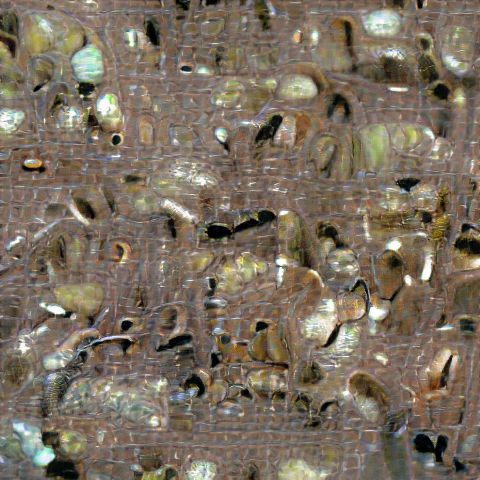

i: 50, loss: 0.748522, losses: 0.748522


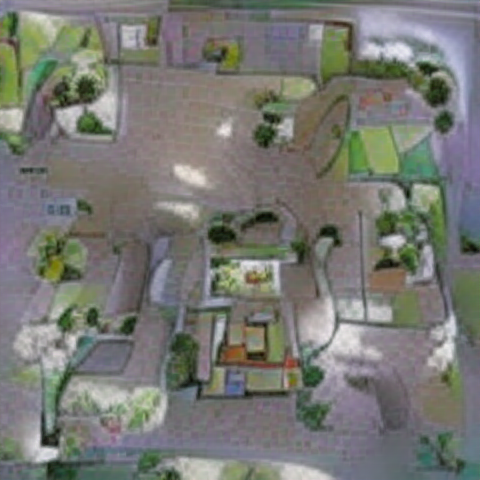

i: 100, loss: 0.712115, losses: 0.712115


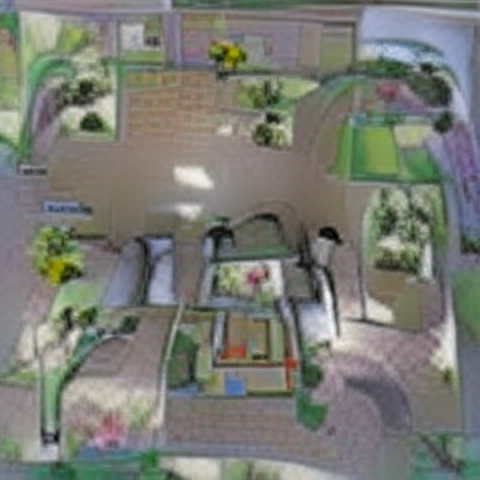

i: 150, loss: 0.701196, losses: 0.701196


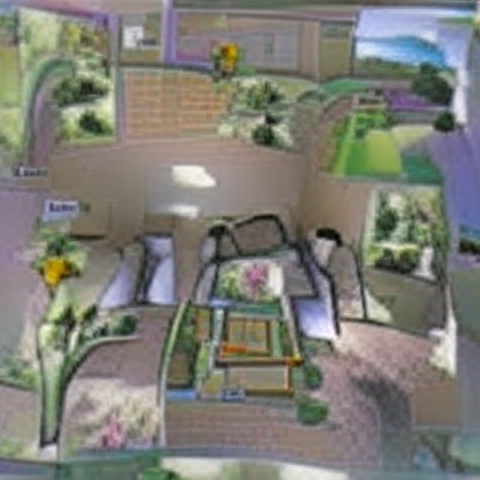

i: 200, loss: 0.687914, losses: 0.687914


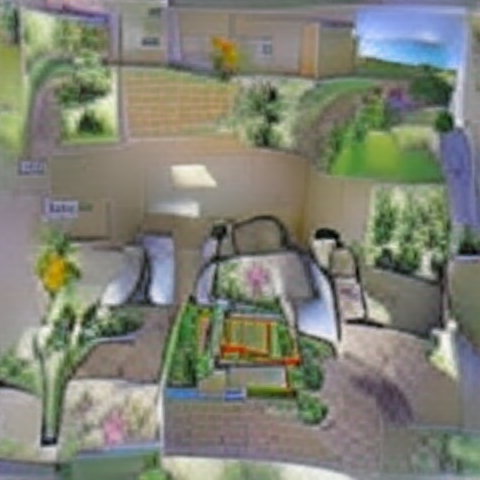

i: 250, loss: 0.680792, losses: 0.680792


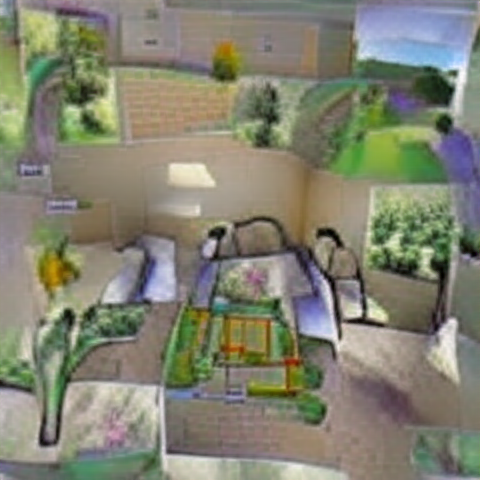

i: 300, loss: 0.680599, losses: 0.680599


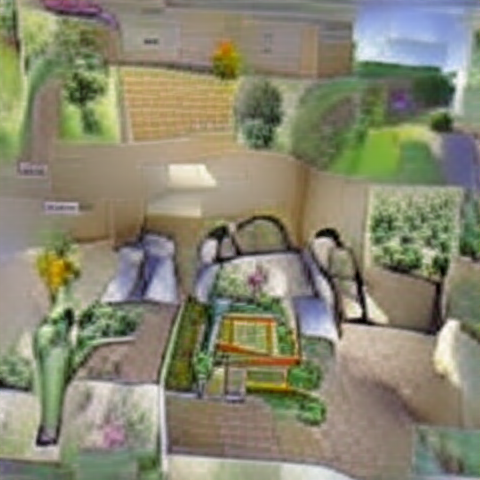

i: 350, loss: 0.675191, losses: 0.675191


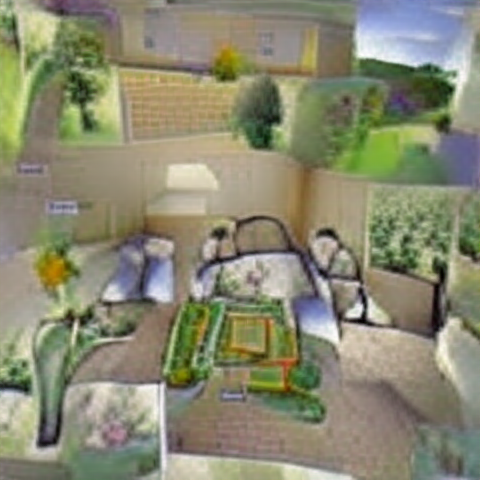

i: 400, loss: 0.668321, losses: 0.668321


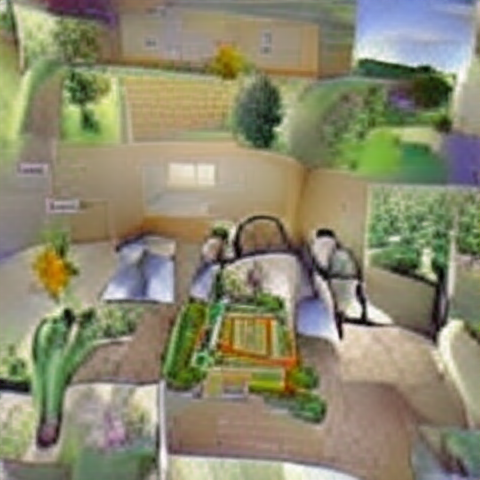

i: 450, loss: 0.676717, losses: 0.676717


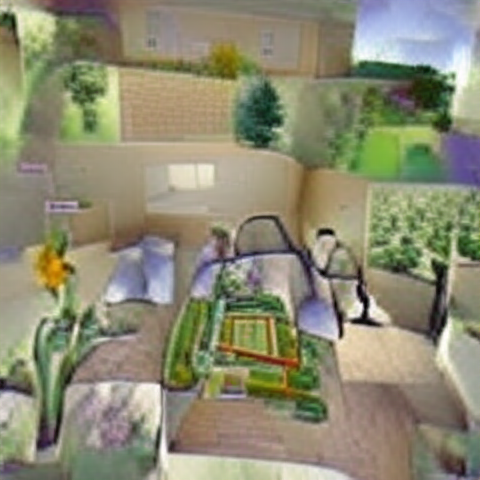

i: 500, loss: 0.668561, losses: 0.668561


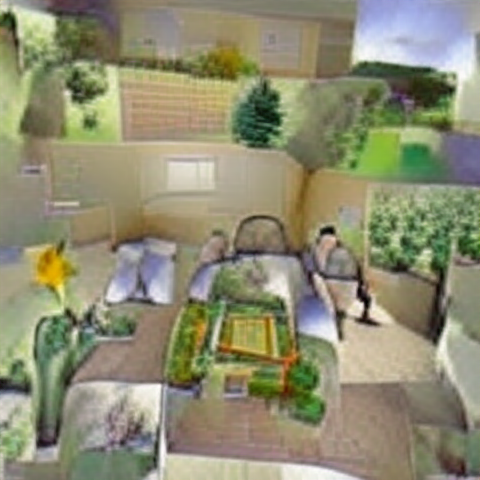

i: 550, loss: 0.671652, losses: 0.671652


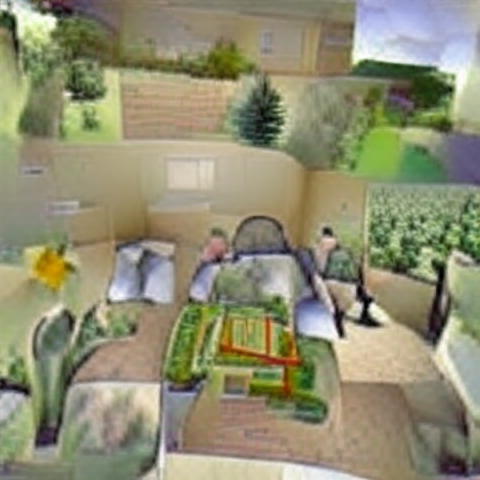

i: 600, loss: 0.672974, losses: 0.672974


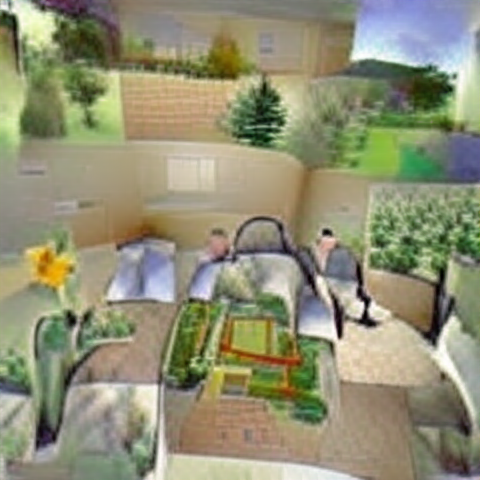

i: 650, loss: 0.657825, losses: 0.657825


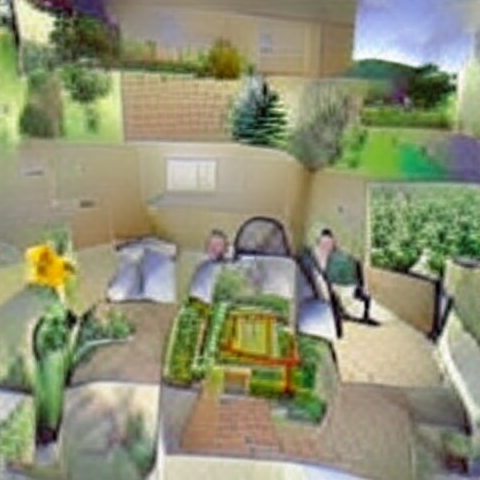

i: 700, loss: 0.663101, losses: 0.663101


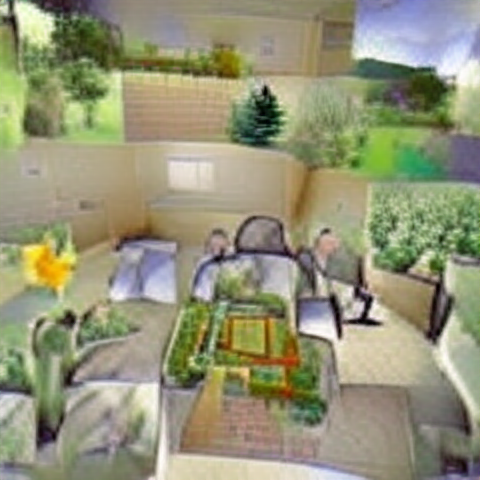

i: 750, loss: 0.662344, losses: 0.662344


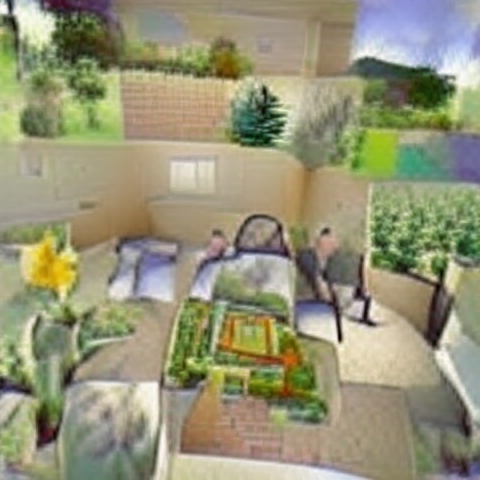

i: 800, loss: 0.663326, losses: 0.663326


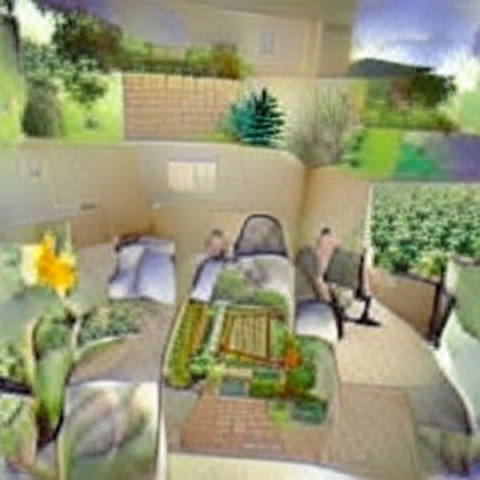

i: 850, loss: 0.664399, losses: 0.664399


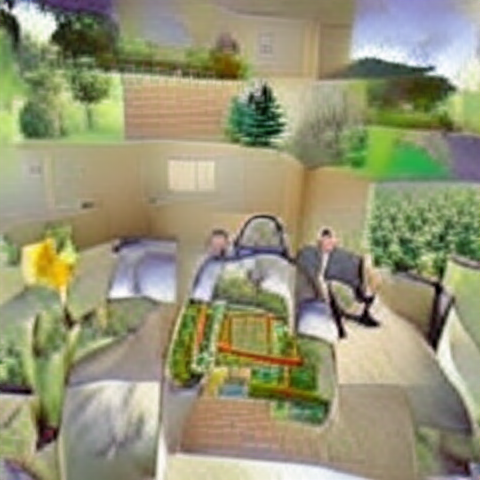

i: 900, loss: 0.654742, losses: 0.654742


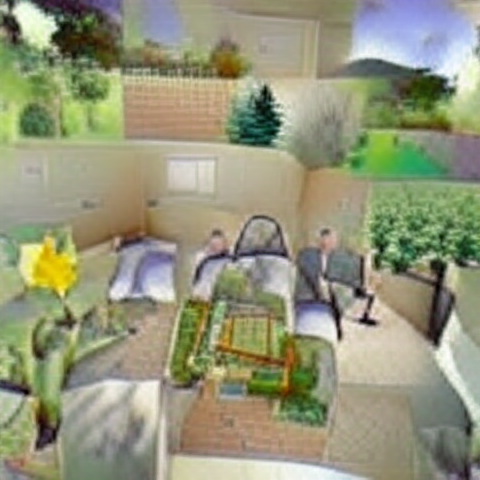

i: 950, loss: 0.660029, losses: 0.660029


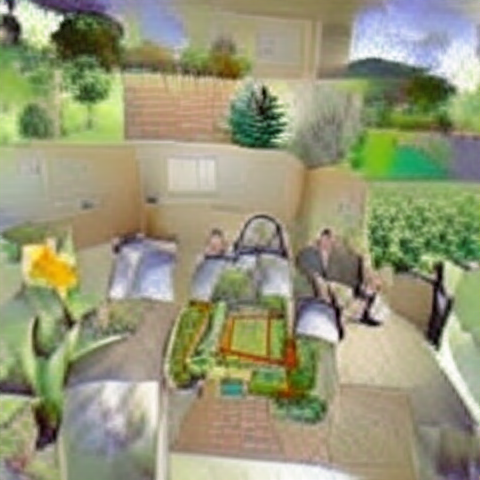

i: 1000, loss: 0.665538, losses: 0.665538


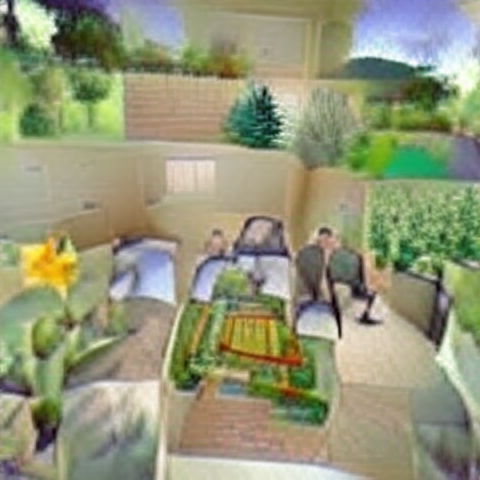

i: 1050, loss: 0.655796, losses: 0.655796


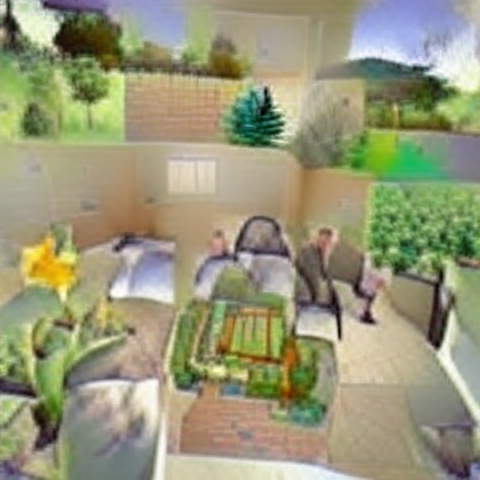

i: 1100, loss: 0.657505, losses: 0.657505


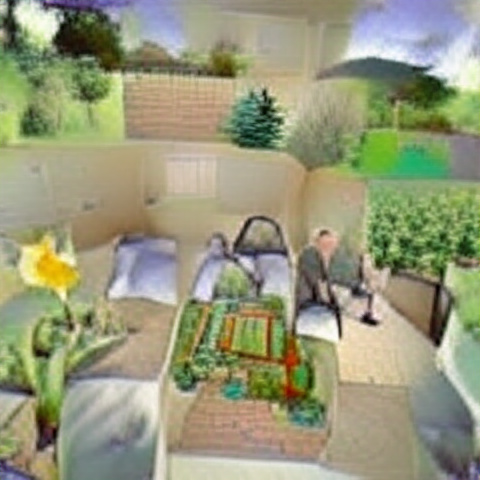

i: 1150, loss: 0.64864, losses: 0.64864


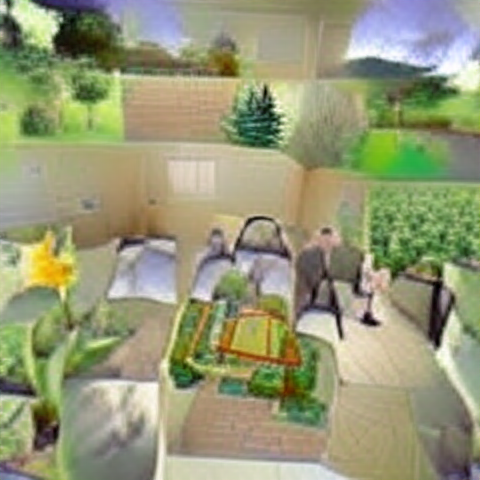

i: 1200, loss: 0.656162, losses: 0.656162


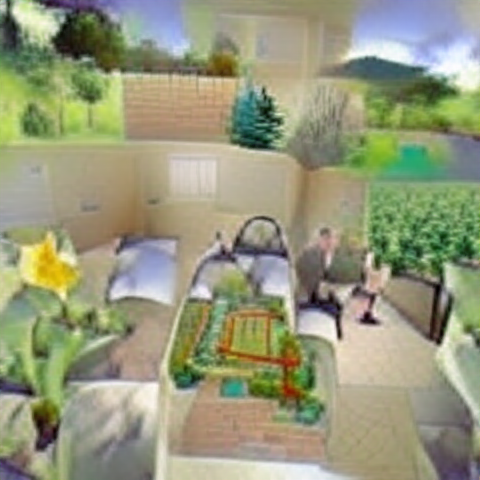

i: 1250, loss: 0.659339, losses: 0.659339


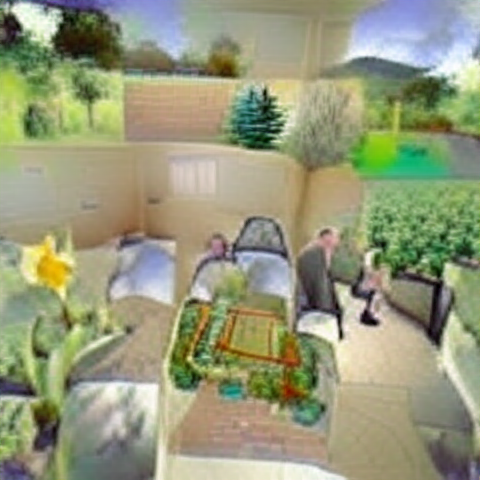

i: 1300, loss: 0.664203, losses: 0.664203


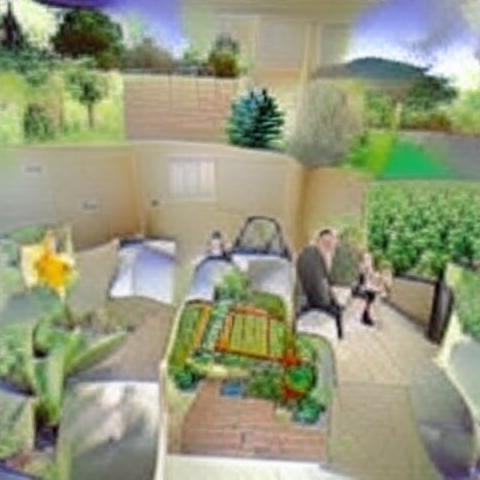

i: 1350, loss: 0.653293, losses: 0.653293


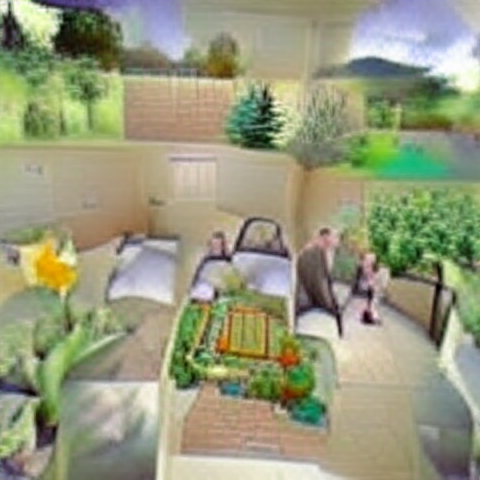

i: 1400, loss: 0.649483, losses: 0.649483


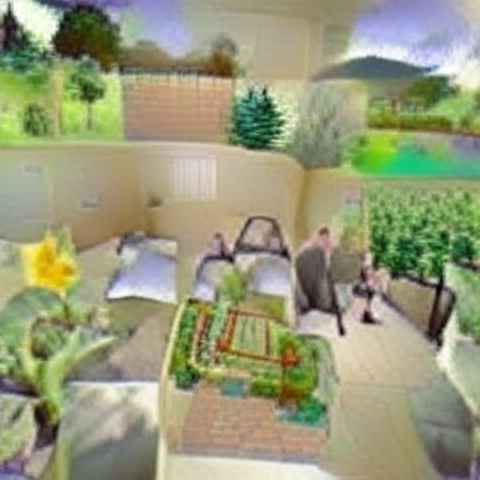

i: 1450, loss: 0.657646, losses: 0.657646


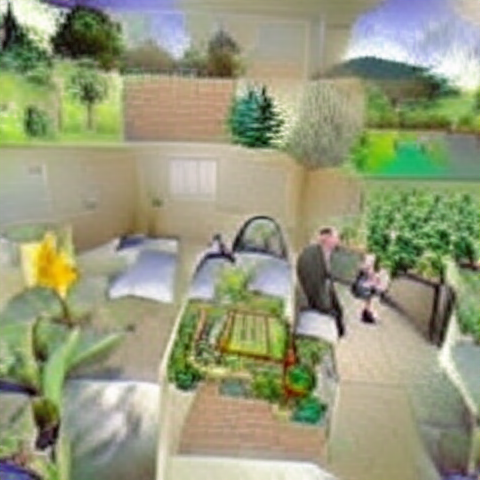

i: 1500, loss: 0.646508, losses: 0.646508


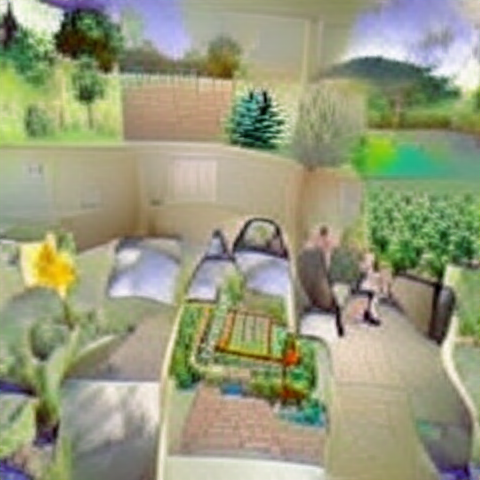

i: 1550, loss: 0.652969, losses: 0.652969


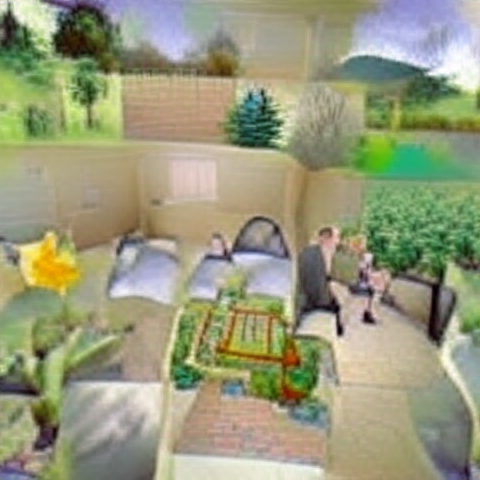

i: 1600, loss: 0.655933, losses: 0.655933


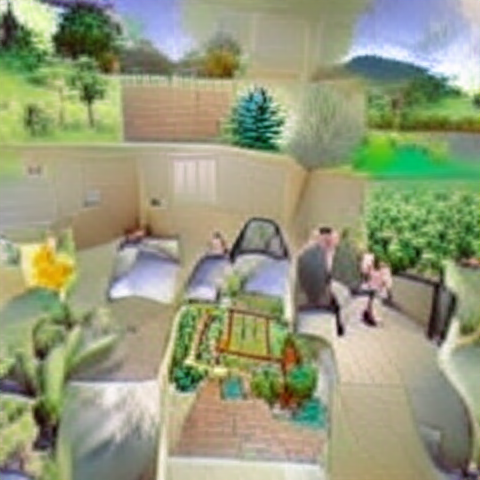

i: 1650, loss: 0.646381, losses: 0.646381


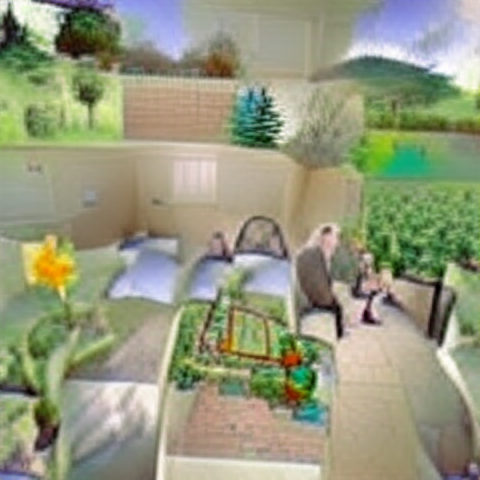

i: 1700, loss: 0.644732, losses: 0.644732


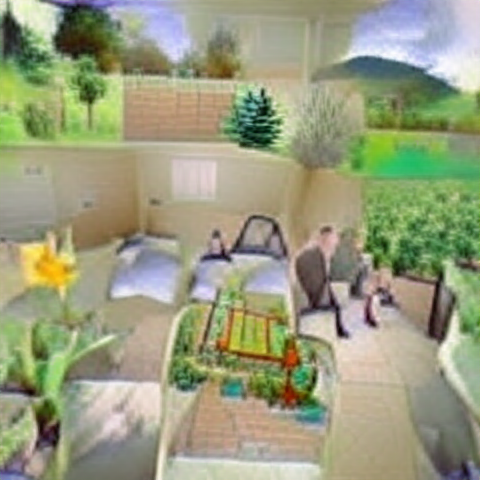

In [ ]:

if args.seed is not None:
    torch.manual_seed(args.seed)

if args.init_image:
    pil_image = Image.open(fetch(args.init_image)).convert('RGB')
    pil_image = pil_image.resize((sideX, sideY), Image.LANCZOS)
    z, *_ = image_model.encode(TF.to_tensor(pil_image).to(device).unsqueeze(0) * 2 - 1)
else:
    one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()
    z = one_hot @ image_model.quantize.embedding.weight
    z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2)
z_orig = z.clone()
z.requires_grad_(True)
opt = optim.Adam([z], lr=args.step_size)

normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                 std=[0.26862954, 0.26130258, 0.27577711])

pMs = []

for prompt in args.prompts:
    txt, weight, stop = parse_prompt(prompt)
    embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
    pMs.append(Prompt(embed, weight, stop).to(device))

for prompt in args.image_prompts:
    path, weight, stop = parse_prompt(prompt)
    img = resize_image(Image.open(fetch(path)).convert('RGB'), (sideX, sideY))
    batch = make_cutouts(TF.to_tensor(img).unsqueeze(0).to(device))
    embed = perceptor.encode_image(normalize(batch)).float()
    pMs.append(Prompt(embed, weight, stop).to(device))

for seed, weight in zip(args.noise_prompt_seeds, args.noise_prompt_weights):
    gen = torch.Generator().manual_seed(seed)
    embed = torch.empty([1, perceptor.visual.output_dim]).normal_(generator=gen)
    pMs.append(Prompt(embed, weight).to(device))

def synth(z):
    z_q = vector_quantize(z.movedim(1, 3), image_model.quantize.embedding.weight).movedim(3, 1)
    return clamp_with_grad(image_model.decode(z_q).add(1).div(2), 0, 1)

@torch.no_grad()
def checkin(i, losses):
    losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
    tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')
    out = synth(z)
    TF.to_pil_image(out[0].cpu()).save('progress.png')
    display.display(display.Image('progress.png'))

def ascend_txt():
    out = synth(z)
    iii = perceptor.encode_image(normalize(make_cutouts(out))).float()

    result = []

    if args.init_weight:
        result.append(F.mse_loss(z, z_orig) * args.init_weight / 2)

    for prompt in pMs:
        result.append(prompt(iii))

    return result

def train(i):
    opt.zero_grad()
    lossAll = ascend_txt()
    if i % args.display_freq == 0:
        checkin(i, lossAll)
    loss = sum(lossAll)
    loss.backward()
    opt.step()
    with torch.no_grad():
        z.copy_(z.maximum(z_min).minimum(z_max))

i = 0
try:
    with tqdm() as pbar:
        while True:
            train(i)
            i += 1
            pbar.update()
except KeyboardInterrupt:
    pass
